In [5]:
import pulp
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import datetime as dt

from src.optimisation import optimize_charging_schedule

# Constants

ChatGPT: 
According to the Federal Statistical Office of Germany (Statistisches Bundesamt), the average annual electricity consumption per household in Germany in 2020 was approximately 2,900 kilowatt-hours (kWh). 

In [5]:
#capacity = [14,28,42] # we can later iterate through different capacities
# ChatGPT: The Tesla Powerwall has a round-trip efficiency of approximately 90%.
charging_efficiency = 0.95  # Charging efficiency
discharging_efficiency = 0.95  # Discharging efficiency
solar_installed_capacity = 3 #kW
annual_consumption_household = 2900 #kWh
f_multiply_consumption = 20
capacity = 14  # Battery capacity Tesla Powerwall
charging_power = 5
discharging_power = 5

In [6]:
df = pd.read_pickle('data/final_dataframe.pkl')

In [7]:
# normalize the solar data so the max output is 1
df['solar_normalized'] = df.Solar_generation_MWh_normalized / df.Solar_generation_MWh_normalized.max()

In [9]:
#begin a new df
df_new = df[['Date']].copy()

In [11]:
# scale solar output to installed capacity
df_new['solar'] = df.loc[:,'solar_normalized'] * solar_installed_capacity

Let's see how much total consumption we have per annum

In [12]:
df['Year'] = pd.to_datetime(df['Date']).dt.year

In [13]:
df[['Total (grid load) [MWh] Original resolutions']].groupby(df.Year).sum()

,Total (grid load) [MWh] Original resolutions
Year,
2018,1.311377e+08
2019,5.024421e+08
2020,4.902315e+08
2021,5.096569e+08
2022,4.876366e+08
2023,2.007118e+08


In [289]:
df2['consumption_subt'] = (df[['Total (grid load) [MWh] Original resolutions']]-9000)

In [290]:
df2

,Date,solar,consumption,demand_after_solar,price,cost_without_battery,demand_after_solar_mask,optimal_charge,optimal_buy,optimal_sell,optimal_soc,optimal_demand_with_battery,optimal_cost_with_battery,consumption_subt
Date,,,,,,,,,,,,,,
2018-10-01 00:00:00,2018-10-01 00:00:00,0.0,1.228411,1.228411,0.05953,0.073127,1,0.0,0.0,0.00000,0.000000,1.228411,7.312731e-02,NaN
2018-10-01 00:15:00,2018-10-01 00:15:00,0.0,1.228411,1.228411,0.05953,0.073127,1,0.0,0.0,0.00000,0.000000,1.228411,7.312731e-02,NaN
2018-10-01 00:30:00,2018-10-01 00:30:00,0.0,1.228411,1.228411,0.05953,0.073127,1,0.0,0.0,0.00000,0.000000,1.228411,7.312731e-02,NaN
2018-10-01 00:45:00,2018-10-01 00:45:00,0.0,1.228411,1.228411,0.05953,0.073127,1,0.0,0.0,0.00000,0.000000,1.228411,7.312731e-02,NaN
2018-10-01 01:00:00,2018-10-01 01:00:00,0.0,1.228411,1.228411,0.05610,0.068914,1,0.0,0.0,0.00000,0.000000,1.228411,6.891386e-02,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-06-01 22:45:00,2023-06-01 22:45:00,0.0,1.501678,1.501678,0.09541,0.143275,1,0.0,0.0,1.50168,0.137041,-0.000002,-1.908200e-07,NaN
2023-06-01 23:00:00,2023-06-01 23:00:00,0.0,1.486859,1.486859,0.08653,0.128658,1,0.0,0.0,1.48686,0.108814,-0.000001,-8.653000e-08,NaN
2023-06-01 23:15:00,2023-06-01 23:15:00,0.0,1.454524,1.454524,0.08653,0.125860,1,0.0,0.0,1.45452,0.080866,0.000004,3.461200e-07,NaN


~5e+08 MWh per year

In [14]:
# normalise consumption data so annual consumption ~1, so we can later upscale it as needed
df['consumption_norm'] = df['Total (grid load) [MWh] Original resolutions']/ 5e+08

In [15]:
df[['consumption_norm']].groupby(df.Year).sum()

,consumption_norm
Year,
2018,0.262275
2019,1.004884
2020,0.980463
2021,1.019314
2022,0.975273
2023,0.401424


In [272]:
df2 = df_new.copy()

In [281]:
df2['consumption'] == df['consumption_norm'].values * annual_consumption_household *f_multiply_consumption

array([ True,  True,  True, ...,  True,  True,  True])

In [280]:
df['consumption_norm']

0         0.000021
1         0.000021
2         0.000021
3         0.000021
4         0.000021
            ...   
163675    0.000026
163676    0.000026
163677    0.000025
163678    0.000025
163679    0.000024
Name: consumption_norm, Length: 163680, dtype: float64

# This needs fixing

In [16]:
# multiply by annual_consumption_household to get to annual consumption of a household, but still multiply because otherwise it's way too low. Check and fix this later.
df_new['consumption'] = df['consumption_norm'] * annual_consumption_household * f_multiply_consumption

In [17]:
df_new['demand_after_solar'] = df_new['consumption'] - df_new['solar']

In [18]:
df_new['price'] = df['Germany/Luxembourg [€/MWh] Calculated resolutions'] / 1000 # euro per kWh

In [19]:
df_new = df_new.set_index(df.Date,drop=True)

In [20]:
df_new.head()

,Date,solar,consumption,demand_after_solar,price
Date,,,,,
2018-10-01 00:00:00,2018-10-01 00:00:00,0.0,1.228411,1.228411,0.05953
2018-10-01 00:15:00,2018-10-01 00:15:00,0.0,1.228411,1.228411,0.05953
2018-10-01 00:30:00,2018-10-01 00:30:00,0.0,1.228411,1.228411,0.05953
2018-10-01 00:45:00,2018-10-01 00:45:00,0.0,1.228411,1.228411,0.05953
2018-10-01 01:00:00,2018-10-01 01:00:00,0.0,1.228411,1.228411,0.05610


In [285]:
#df_new[['solar','consumption','demand_after_solar','cost','price']].plot(xlim=(25150,25250),ylim=(-2,4))

In [21]:
df_new['cost_without_battery'] = 0

In [22]:
df_new['demand_after_solar_mask'] = (df_new.demand_after_solar > 0).astype(int)

In [37]:
df_new.cost_without_battery = df_new.demand_after_solar * df_new.price * df_new.demand_after_solar_mask

Might have to shorten df_new to a year

In [25]:
optimal_charge, optimal_buy, optimal_sell, optimal_soc, objective, status = optimize_charging_schedule(price=np.array(df_new.price), demand_after_solar=np.array(df_new.demand_after_solar),
                                                            state_of_charge=0, capacity=capacity,
                                                            charging_efficiency= charging_efficiency,
                                                            discharging_efficiency=discharging_efficiency,
                                                            charging_power=charging_power, discharging_power=discharging_power,
                                                            window=np.array(df_new.demand_after_solar).shape[0]
                                                            )

In [26]:
df_new['optimal_charge'] = optimal_charge
df_new['optimal_buy'] = optimal_buy
df_new['optimal_sell'] = optimal_sell
df_new['optimal_soc'] = optimal_soc
df_new['optimal_demand_with_battery'] = df_new.demand_after_solar - df_new.optimal_sell + df_new.optimal_charge
df_new['optimal_cost_with_battery'] = df_new.optimal_demand_with_battery * df_new.price

<Axes: xlabel='Date'>

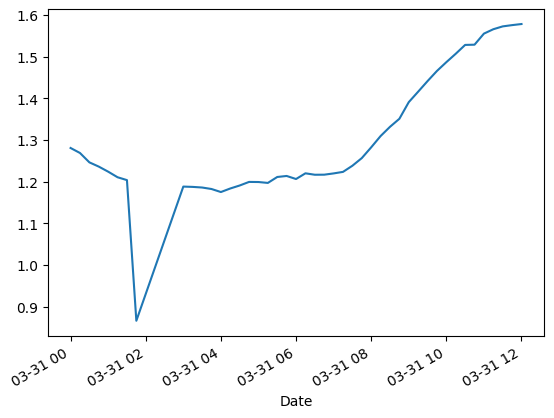

In [260]:
df_new.loc['2019-03-31 00:00:00':'2019-03-31 12:00:00','consumption'].plot()

In [263]:
df_new.loc['2019-03-31 00:00:00':'2019-03-31 12:00:00']

,Date,solar,consumption,demand_after_solar,price,cost_without_battery,demand_after_solar_mask,optimal_charge,optimal_buy,optimal_sell,optimal_soc,optimal_demand_with_battery,optimal_cost_with_battery
Date,,,,,,,,,,,,,
2019-03-31 00:00:00,2019-03-31 00:00:00,0.000000,1.280930,1.280930,0.04010,0.051365,1,0.000000,0.0,1.280930,0.253883,0.000000e+00,0.000000e+00
2019-03-31 00:15:00,2019-03-31 00:15:00,0.000000,1.268953,1.268953,0.04010,0.050885,1,0.000000,0.0,1.268950,0.229805,3.000000e-06,1.203000e-07
2019-03-31 00:30:00,2019-03-31 00:30:00,0.000000,1.246478,1.246478,0.04010,0.049984,1,0.000000,0.0,1.246480,0.205953,-2.000000e-06,-8.020000e-08
2019-03-31 00:45:00,2019-03-31 00:45:00,0.000000,1.236299,1.236299,0.04010,0.049576,1,0.000000,0.0,1.236300,0.182522,-1.000000e-06,-4.010000e-08
2019-03-31 01:00:00,2019-03-31 01:00:00,0.000000,1.224148,1.224148,0.03395,0.041560,1,0.000000,0.0,1.224150,0.159284,-2.000000e-06,-6.790000e-08
2019-03-31 01:15:00,2019-03-31 01:15:00,0.000000,1.210779,1.210779,0.03395,0.041106,1,0.000000,0.0,1.210780,0.136273,-1.000000e-06,-3.395000e-08
2019-03-31 01:30:00,2019-03-31 01:30:00,0.000000,1.203906,1.203906,0.03395,0.040873,1,0.000000,0.0,1.203910,0.113514,-4.000000e-06,-1.358000e-07
2019-03-31 01:45:00,2019-03-31 01:45:00,0.000000,0.866636,0.866636,0.03395,0.029422,1,0.000000,0.0,0.866636,0.090885,1.110223e-16,3.769207e-18
2019-03-31 03:00:00,2019-03-31 03:00:00,0.000000,1.188391,1.188391,0.03195,0.037969,1,0.000000,0.0,0.000000,0.074594,1.188391e+00,3.796909e-02


<Axes: xlabel='Date'>

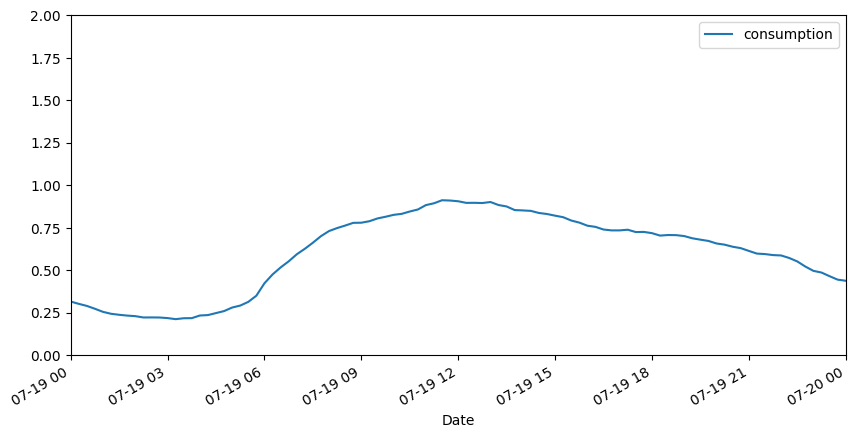

In [238]:
(df_new[['consumption']]-1).plot(xlim=(pd.Timestamp('2022-07-19 00:00:00'), pd.Timestamp('2022-07-20 00:00:00')),ylim=(0,2),figsize=(10,5))

<Axes: xlabel='Date'>

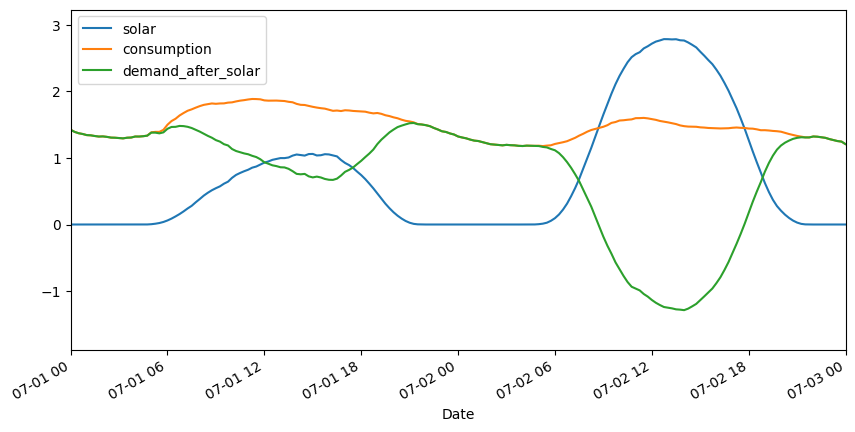

In [216]:
df_new[['solar','consumption','demand_after_solar']].plot(xlim=(pd.Timestamp('2022-07-01 00:00:00'), pd.Timestamp('2022-07-03 00:00:00')),figsize=(10,5))

<Axes: xlabel='Date'>

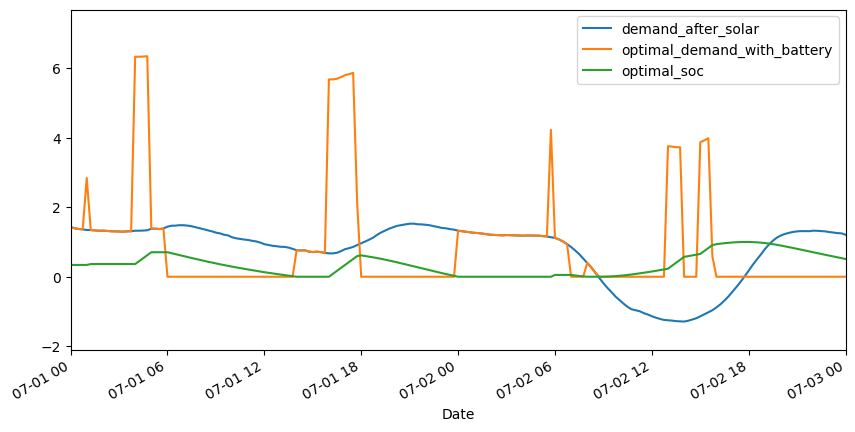

In [223]:
df_new[['demand_after_solar','optimal_demand_with_battery','optimal_soc']].plot(xlim=(pd.Timestamp('2022-07-01 00:00:00'), pd.Timestamp('2022-07-03 00:00:00')),figsize=(10,5))

<Axes: xlabel='Date'>

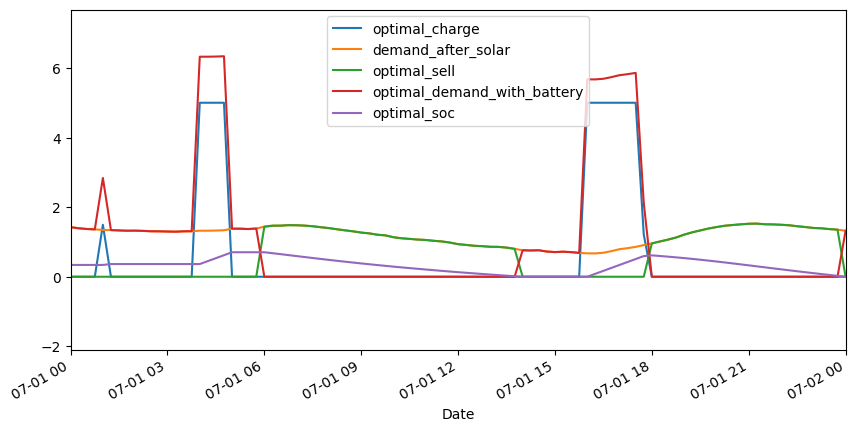

In [218]:
df_new[['optimal_charge','demand_after_solar','optimal_sell','optimal_demand_with_battery','optimal_soc']].plot(xlim=(pd.Timestamp('2022-07-01 00:00:00'), pd.Timestamp('2022-07-02 00:00:00')),figsize=(10,5))

<Axes: xlabel='Date'>

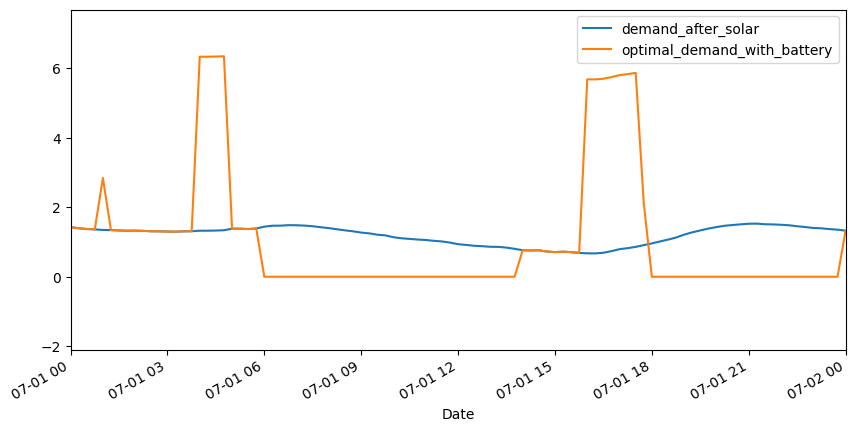

In [219]:
df_new[['demand_after_solar','optimal_demand_with_battery']].plot(xlim=(pd.Timestamp('2022-07-01 00:00:00'), pd.Timestamp('2022-07-02 00:00:00')),figsize=(10,5))

<Axes: xlabel='Date'>

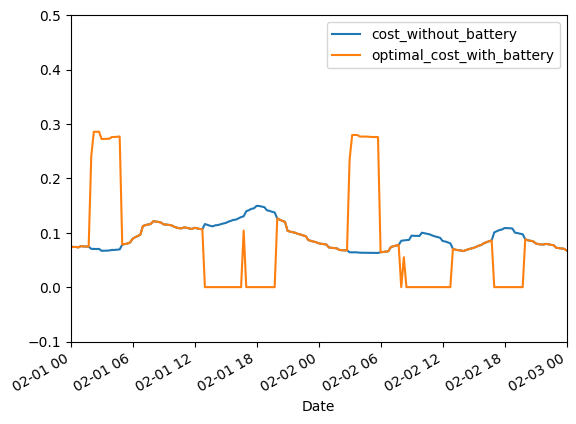

In [39]:
df_new[['cost_without_battery','optimal_cost_with_battery']].plot(ylim=(-0.1,0.5),xlim=(pd.Timestamp('2019-02-01 00:00:00'), pd.Timestamp('2019-02-03 00:00:00')))

In [43]:
sum_without_battery = df_new.cost_without_battery.loc['2019-02-01 00:00:00':'2019-02-09 00:00:00'].sum()
sum_with_battery = df_new.optimal_cost_with_battery.loc['2019-02-01 00:00:00':'2019-02-09 00:00:00'].sum()
print(sum_without_battery)
print(sum_with_battery)
print(1-sum_with_battery/sum_without_battery)

65.07793832844942
58.8880311883714
0.09511529251030448


In [8]:
df_new[['optimal_charge','demand_after_solar','optimal_sell','optimal_soc']].plot(xlim=(pd.Timestamp('2019-07-01 00:00:00'), pd.Timestamp('2019-07-03 00:00:00')))

NameError: name 'df_new' is not defined

<Axes: xlabel='Date'>

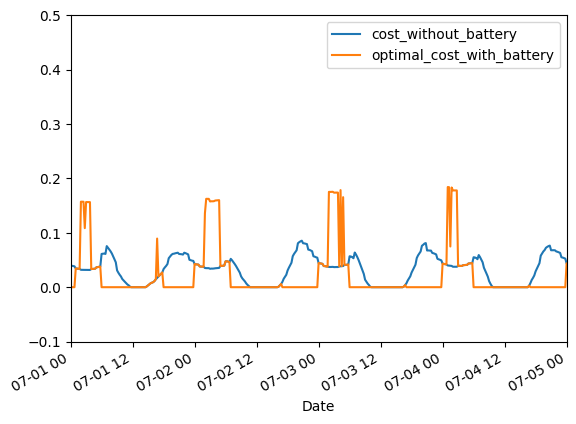

In [224]:
df_new[['cost_without_battery','optimal_cost_with_battery']].plot(ylim=(-0.1,0.5),xlim=(pd.Timestamp('2019-07-01 00:00:00'), pd.Timestamp('2019-07-05 00:00:00')))

In [44]:
sum_without_battery = df_new.cost_without_battery.loc['2019-07-01 00:00:00':'2019-07-09 00:00:00'].sum()
sum_with_battery = df_new.optimal_cost_with_battery.loc['2019-07-01 00:00:00':'2019-07-09 00:00:00'].sum()
print(sum_without_battery)
print(sum_with_battery)
print(1-sum_with_battery/sum_without_battery)

23.745396139400984
17.552887354043822
0.26078776487884603


In [45]:
sum_without_battery = df_new.cost_without_battery.sum()
sum_with_battery = df_new.optimal_cost_with_battery.sum()
print(sum_without_battery)
print(sum_with_battery)
print(1-sum_with_battery/sum_without_battery)

20778.98531289025
15618.083835784253
0.24837119808272978


<Axes: xlabel='Date'>

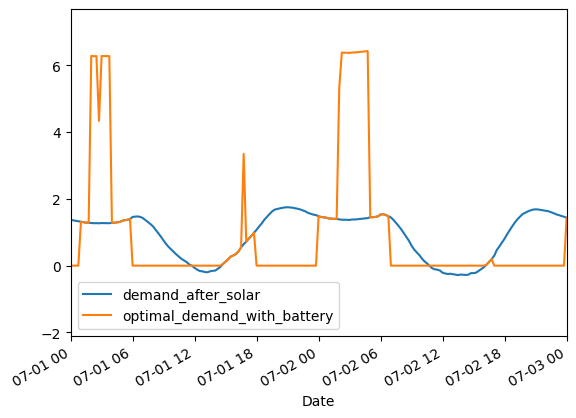

In [46]:
df_new[['demand_after_solar','optimal_demand_with_battery']].plot(xlim=(pd.Timestamp('2019-07-01 00:00:00'), pd.Timestamp('2019-07-03 00:00:00')))

<Axes: xlabel='Date'>

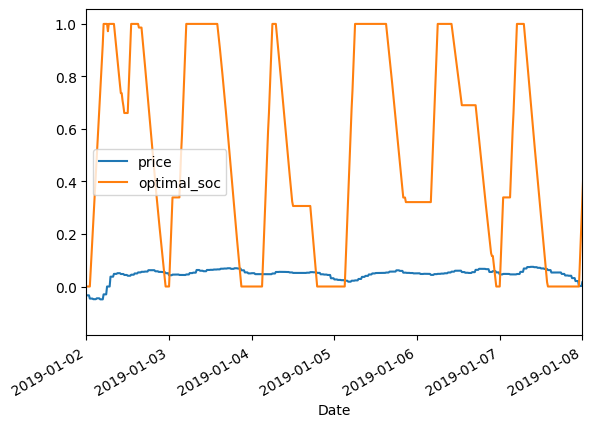

In [52]:
df_new[['price','optimal_soc']].plot(xlim=(pd.Timestamp('2019-01-02 00:00:00'), pd.Timestamp('2019-01-08 00:00:00')))

We can see that the battery is always close to empty around midnight

<Axes: xlabel='Date'>

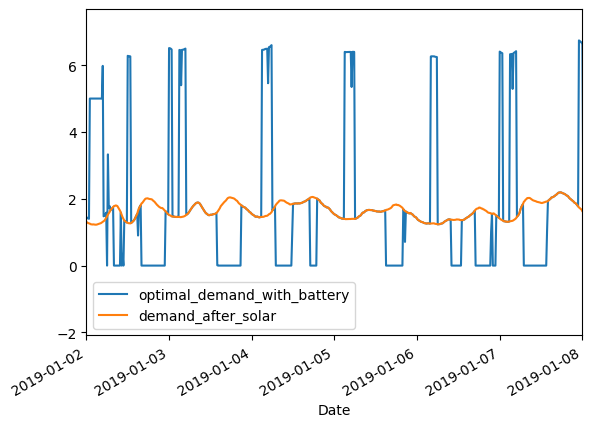

In [54]:
df_new[['optimal_demand_with_battery','demand_after_solar']].plot(xlim=(pd.Timestamp('2019-01-02 00:00:00'), pd.Timestamp('2019-01-08 00:00:00')))

In [139]:
df_new.to_pickle('data/df_new.pkl')

Use multiples of Tesla power wall to find optimal amount of power walls to install

In [59]:
df_one_year = df_new.loc['2022-06-01 00:00:00':'2023-05-31 23:45:00'].copy()

In [61]:
s = 0
optimal_charge_24h_forecast = []
optimal_buy_24h_forecast = []
optimal_sell_24h_forecast = []
for t in range(len(df_one_year)-96):
    optimal_charge, optimal_buy, optimal_sell, optimal_soc, objective, status = optimize_charging_schedule(price=np.array(df_one_year.price.iloc[t:t+96]), demand_after_solar=np.array(df_one_year.demand_after_solar.iloc[t:t+96]),
                                                            state_of_charge=s, capacity=capacity,
                                                            charging_efficiency= charging_efficiency,
                                                            discharging_efficiency=discharging_efficiency,
                                                            charging_power=charging_power, discharging_power=discharging_power
                                                            )
    s = optimal_soc[1]
    optimal_charge_24h_forecast.append(optimal_charge[0])
    optimal_buy_24h_forecast.append(optimal_buy[0])
    optimal_sell_24h_forecast.append(optimal_sell[0])
    if t % 1000 == 0:
        print(str(t)+'/'+str(len(df_one_year)))
    

0/35040


1000/35040
2000/35040
3000/35040
4000/35040
5000/35040
6000/35040
7000/35040
8000/35040
9000/35040
10000/35040
11000/35040
12000/35040
13000/35040
14000/35040
15000/35040
16000/35040
17000/35040
18000/35040
19000/35040
20000/35040
21000/35040
22000/35040
23000/35040
24000/35040
25000/35040
26000/35040
27000/35040
28000/35040
29000/35040
30000/35040
31000/35040
32000/35040
33000/35040
34000/35040


In [62]:
len(optimal_charge_24h_forecast)

34944

In [63]:
df24 = df_one_year.iloc[0:len(optimal_charge_24h_forecast),:].copy()

In [64]:
df24['optimal_charge_24h_forecast'] = optimal_charge_24h_forecast
df24['optimal_buy_24h_forecast'] = optimal_buy_24h_forecast
df24['optimal_sell_24h_forecast'] = optimal_sell_24h_forecast

<Axes: xlabel='Date'>

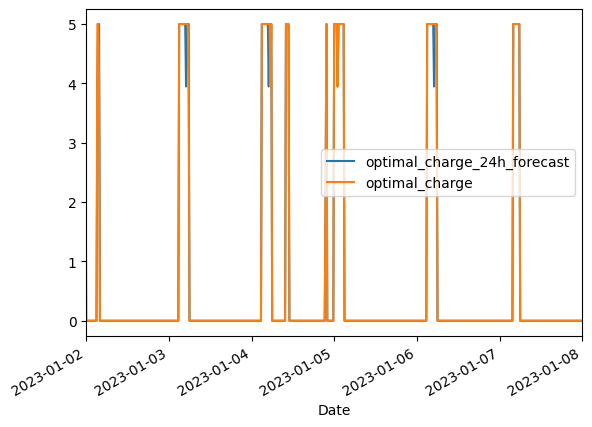

In [69]:
df24[['optimal_charge_24h_forecast','optimal_charge']].plot(xlim=(pd.Timestamp('2023-01-02 00:00:00'), pd.Timestamp('2023-01-08 00:00:00')))

In [70]:
df24['diff_sell'] = df24.optimal_sell - df24.optimal_sell_24h_forecast
df24['diff_buy'] = df24.optimal_buy - df24.optimal_buy_24h_forecast
df24['diff_charge'] = df24.optimal_charge - df24.optimal_charge_24h_forecast

<Axes: xlabel='Date'>

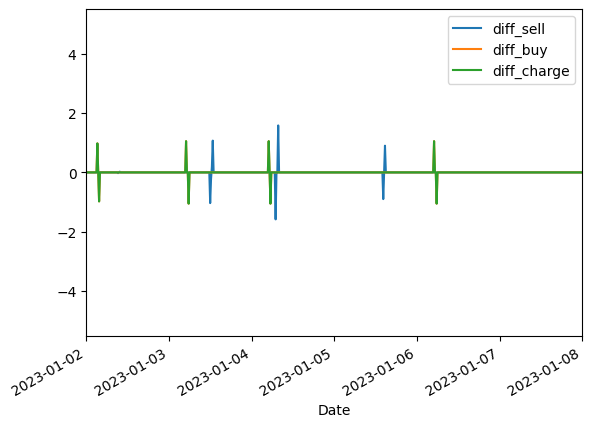

In [71]:
df24[['diff_sell','diff_buy','diff_charge']].plot(xlim=(pd.Timestamp('2023-01-02 00:00:00'), pd.Timestamp('2023-01-08 00:00:00')))

In [73]:
df24['cost_24h_forecast'] = (df24.demand_after_solar + df24.optimal_charge_24h_forecast - df24.optimal_sell_24h_forecast) * df24.price


<Axes: xlabel='Date'>

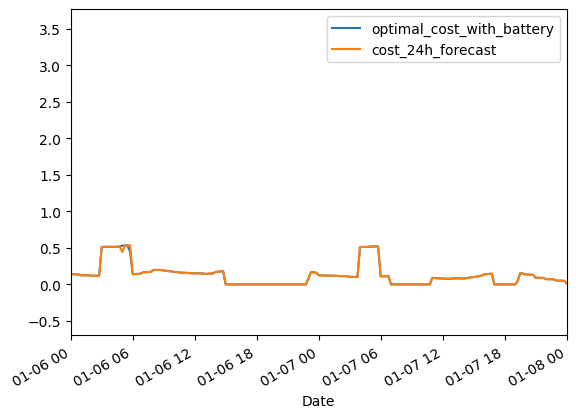

In [78]:
df24[['optimal_cost_with_battery','cost_24h_forecast']].plot(xlim=(pd.Timestamp('2023-01-06 00:00:00'), pd.Timestamp('2023-01-08 00:00:00')))

As we can see, there is nearly no difference between optimised cost knowing all the data and optimised cost only seeing 24h into the future

In [140]:
df24.to_pickle('data/df24.pkl')

In [79]:
result = df24[['cost_without_battery','optimal_cost_with_battery','cost_24h_forecast']].sum()

In [81]:
result

cost_without_battery         8504.555898
optimal_cost_with_battery    6249.197999
cost_24h_forecast            6253.415532
dtype: float64

In [80]:
result[1]/result[0]

0.7348059174567189

In [82]:
result[2]/result[0]

0.73530183196282

In [83]:
df_solar = pd.read_pickle('data/solar_predictions.pkl')

In [129]:
df_pred = df_one_year.loc['2022-06-07 23:45:00':'2023-05-31 23:30:00'].copy()

Careful, there seem to be duplicate indices

In [130]:
df_pred = df_pred.reset_index(drop=True)

In [132]:
df_pred = pd.concat([df_pred, df_solar], axis=1)

In [133]:
# scale solar as above
df_pred.output = df_pred.output / df.Solar_generation_MWh_normalized.max() * solar_installed_capacity

In [ ]:
demand_after_solar_test = np.array(df_pred.consumption.iloc[t:t+96]) - df_pred.output[t]

In [149]:
s = 0
optimal_charge_pred = []
optimal_buy_pred = []
optimal_sell_pred = []
for t in range(len(df_pred)):
    demand_after_solar_pred = np.array(df_pred.consumption.iloc[t:t+96]) - df_pred.output[t]
    optimal_charge, optimal_buy, optimal_sell, optimal_soc, objective, status = optimize_charging_schedule(price=np.array(df_pred.price.iloc[t:t+96]), demand_after_solar=demand_after_solar_pred,
                                                            state_of_charge=s, capacity=capacity,
                                                            charging_efficiency= charging_efficiency,
                                                            discharging_efficiency=discharging_efficiency,
                                                            charging_power=charging_power, discharging_power=discharging_power
                                                            )
    s = optimal_soc[1]
    optimal_charge_pred.append(optimal_charge[0])
    optimal_buy_pred.append(optimal_buy[0])
    optimal_sell_pred.append(optimal_sell[0])
    if t % 1000 == 0:
        print(str(t)+'/'+str(len(df_pred)))
    

0/34368
1000/34368
2000/34368
3000/34368
4000/34368
5000/34368
6000/34368
7000/34368
8000/34368
9000/34368
10000/34368
11000/34368
12000/34368
13000/34368
14000/34368
15000/34368
16000/34368
17000/34368
18000/34368
19000/34368
20000/34368
21000/34368
22000/34368
23000/34368
24000/34368
25000/34368
26000/34368
27000/34368
28000/34368
29000/34368
30000/34368
31000/34368
32000/34368
33000/34368
34000/34368


ValueError: operands could not be broadcast together with shapes (95,) (96,) 

In [150]:
len(optimal_charge_pred)

34273

In [151]:
df_pred2 = df_pred.iloc[0:len(optimal_charge_pred),:].copy()

In [153]:
df_pred2['optimal_charge_pred'] = optimal_charge_pred
df_pred2['optimal_buy_pred'] = optimal_buy_pred
df_pred2['optimal_sell_pred'] = optimal_sell_pred

In [164]:
df_pred2 = df_pred2.iloc[:,1:] #There are two date columns

In [166]:
df_pred2 = df_pred2.set_index(df_pred2.Date)

<Axes: xlabel='Date'>

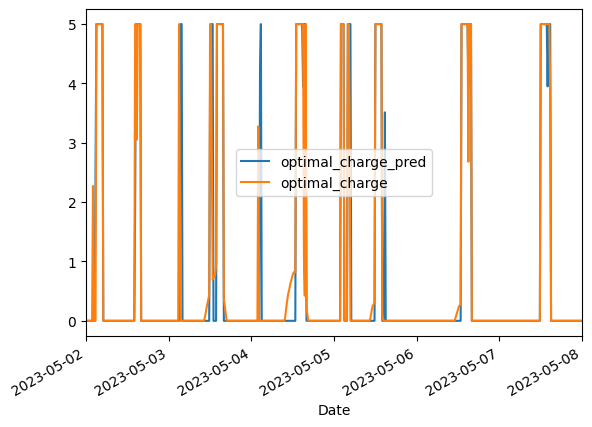

In [169]:
df_pred2[['optimal_charge_pred','optimal_charge']].plot(xlim=(pd.Timestamp('2023-05-02 00:00:00'), pd.Timestamp('2023-05-08 00:00:00')))

In [170]:
df_pred2['diff_sell'] = df_pred2.optimal_sell - df_pred2.optimal_sell_pred
df_pred2['diff_buy'] = df_pred2.optimal_buy - df_pred2.optimal_buy_pred
df_pred2['diff_charge'] = df_pred2.optimal_charge - df_pred2.optimal_charge_pred

In [171]:
df_pred2['cost_pred'] = (df_pred2.demand_after_solar + df_pred2.optimal_charge_pred - df_pred2.optimal_sell_pred) * df_pred2.price


In [179]:
cost_without_battery = df_pred2.demand_after_solar_mask * df_pred2.demand_after_solar * df_pred2.price

In [180]:
cost_without_battery.sum()

8406.035687191365

In [187]:
df_pred2['demand_after_battery_pred'] = df_pred2.demand_after_solar + df_pred2.optimal_buy_pred - df_pred2.optimal_sell_pred

In [191]:
df_pred2['demand_after_battery_pred_mask'] = (df_pred2['demand_after_battery_pred'] > 0).astype(int)

<Axes: xlabel='Date'>

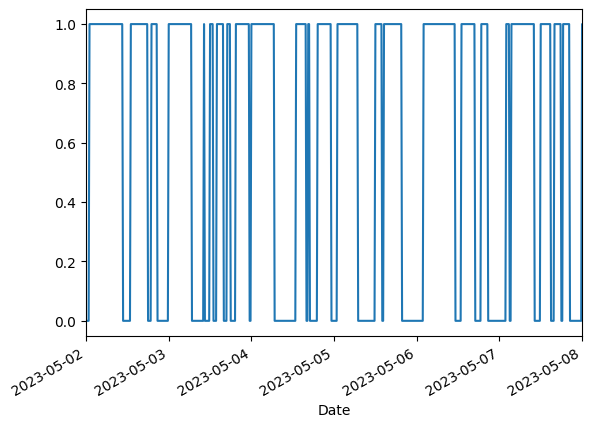

In [194]:
df_pred2.demand_after_battery_pred_mask.plot(xlim=(pd.Timestamp('2023-05-02 00:00:00'), pd.Timestamp('2023-05-08 00:00:00')))

# FIX THIS

Need to make sure not to sell back to the grid. Restrict this from happening, keep the energy in the battery, which in turn should give more savings.

Compare to simple heuristic control algorithms and their savings.

In [195]:
df_pred2['cost_pred2'] = df_pred2['demand_after_battery_pred'] *df_pred2['demand_after_battery_pred_mask'] * df_pred2.price

In [196]:
result = df_pred2[['cost_without_battery','optimal_cost_with_battery','cost_pred','cost_pred2']].sum()

In [197]:
result

cost_without_battery         8406.035687
optimal_cost_with_battery    6181.074306
cost_pred                    6156.513738
cost_pred2                   6623.677979
dtype: float64

In [202]:
1 - result[1]/result[0]

0.264686168851459

In [200]:
1 - result[3]/result[0]

0.21203308846985902

In [201]:
result[3]/result[1]

1.0716062695289674

<Axes: xlabel='Date'>

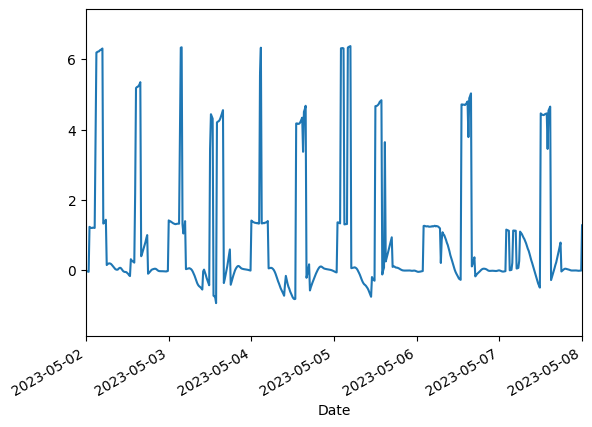

In [190]:
df_pred2['demand_after_battery_pred'].plot(xlim=(pd.Timestamp('2023-05-02 00:00:00'), pd.Timestamp('2023-05-08 00:00:00')))

In [203]:
df_pred2.to_pickle('data/df_pred2.pkl')

In [174]:
result

cost_without_battery         8406.035687
optimal_cost_with_battery    6181.074306
cost_pred                    6156.513738
dtype: float64

This should not be correct. The charging with predicted solar generation saves more money than charging, knowing the exact 

# Outlook

Iterate through different solar array sizes

In [97]:
for i in range(3,9):
    # here we can iterate through different solar array sizes
    pass

In [34]:
from bokeh.plotting import figure, show
from bokeh.io import output_notebook
import pandas as pd

output_notebook()

p = figure(x_axis_label='Date', y_axis_label='Value', width=800, height=400)
p.line(df_new.index, df_new['optimal_charge'], line_color='blue', legend_label='Optimal Charge')
p.line(df_new.index, df_new['demand_after_solar'], line_color='green', legend_label='Demand after Solar')
p.line(df_new.index, df_new['optimal_sell'], line_color='red', legend_label='Optimal Sell')
p.line(df_new.index, df_new['optimal_demand_with_battery'], line_color='orange', legend_label='Demand after Discharge')
p.line(df_new.index, df_new['optimal_soc'], line_color='purple', legend_label='SOC')

p.x_range.start = pd.Timestamp('2019-02-01 00:00:00')
p.x_range.end = pd.Timestamp('2019-02-03 00:00:00')

show(p)


Loading BokehJS ...

In [204]:
2000 * 0.2

400.0

In [206]:
9200 /4

2300.0

In [4]:
def optimal_capacity(price_per_kWh, payback_time):
    '''
    We could create a function which iterates different capacity sizes and finds the 
    '''
    pass